In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.cluster
from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.metrics import davies_bouldin_score
import plotly
import plotly.express as px

In [2]:
def elbow(r, data):
    wcss = []
    
    for i in r:
        kmeans = KMeans(i)
        kmeans.fit(data) 
        wcss_iter = kmeans.inertia_
        wcss.append(wcss_iter)
        
    sns.set()    
    return plt.plot(r, wcss)

In [3]:
df = pd.read_csv("DatasetClientClustering.csv", 
                 engine='c', 
                 sep=',', 
                 encoding='latin-1')
df = df.drop(df.columns[list(np.arange(8))], axis=1)

### Data pre processing: 
- pulizia NA-Napoli, aggiunta di regione e ripartizione territoriale
- rimozione di dati relativi ai minorenni: si perdono solo 40 osservazioni che sono quasi certamente opera dei genitori
- divisione in due sotto dataset

In [17]:
df['Prov'] = df['Prov'].fillna(str('NA'))

In [18]:
cap = pd.read_csv('cap.csv', sep = ';').drop(columns = ['Comune', 'CAP', 'Prefisso'])
cap['Provincia'] = cap['Provincia'].fillna(str('NA'))

prov = cap.groupby(['Regione', 'Provincia', 'Ripartizione']).count().reset_index().rename(columns = {'Provincia' : 'Prov'})

In [19]:
df1 = df.join(prov.set_index('Prov'), on = 'Prov', how = 'left')
df1

,ClientID,RiskPropension,PortfolioRisk,ClientInvestmentHorizon,PortfolioHorizon,ClientKnowledgeExperience,ClientPotentialIndex,IncomeHighLow,Sex,AuM,...,ClientDateStart,NoTrustInBanks,Prov,BondInvestments,EquityInvestments,MoneyMarketInvestments,OtherInvestments,Cash,Regione,Ripartizione
0,Client1,0.597553,0.087787,20.778831,3.7027,0.285714,0.148466,0,1,13719,...,2015,0,PA,0.5730,0.4270,0.0000,0.0000,0.0000,SIC,ISOLE
1,Client2,0.501486,0.062290,15.228477,2.7327,0.714286,0.152761,0,1,45973,...,2016,0,RM,0.5341,0.4466,0.0124,0.0000,0.0070,LAZ,C
2,Client3,0.554108,0.000000,9.675789,0.5000,0.523810,0.243558,0,0,10233,...,2015,0,BS,0.0000,0.0000,0.0000,0.0000,1.0000,LOM,NO
3,Client4,0.440729,0.032341,9.563829,2.5676,0.619048,0.089571,0,0,25144,...,2015,0,RE,0.6428,0.1220,0.0407,0.1943,0.0002,EMR,NE
4,Client5,0.540528,0.037852,17.941533,2.4911,0.428571,0.162577,0,0,222892,...,2015,0,MI,0.1707,0.2701,0.5332,0.0045,0.0215,LOM,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,Client4996,0.417480,0.061442,39.616461,3.4684,0.619048,0.174847,0,0,26348,...,2006,0,CO,0.3792,0.4520,0.0671,0.0830,0.0187,LOM,NO
4996,Client4997,0.594193,0.023741,12.897960,1.0325,0.809524,0.292025,0,1,1002570,...,2016,1,FI,0.9012,0.0283,0.0197,0.0495,0.0012,TOS,C
4997,Client4998,0.577775,0.000000,15.481864,0.5000,0.523810,0.096933,0,1,31032,...,2016,0,PU,0.0000,0.0000,0.0000,0.0000,1.0000,MAR,C
4998,Client4999,0.402162,0.014505,7.220000,1.7193,0.523810,0.142945,0,0,50243,...,2015,0,SA,0.6541,0.1626,0.1635,0.0000,0.0198,CAM,S


In [20]:
#Ci sono 19 osservazioni in cui provincia = 'EE' questo significa che si trovano all'estero
df1[df1['Regione'].isna()]

df1['Regione'] = df1['Regione'].fillna('Estero')
df1['Ripartizione'] = df1['Ripartizione'].fillna('Estero')

In [21]:
df1 = df1[df1['Age'] >= 18]

In [22]:
current_investment = ["PortfolioRisk", "PortfolioHorizon", "AuM", "BondInvestments", "EquityInvestments",
                     "MoneyMarketInvestments", "OtherInvestments", "Cash"]
person_var = ["RiskPropension", "ClientInvestmentHorizon", "ClientKnowledgeExperience", "ClientPotentialIndex",
             "IncomeHighLow", "Sex", "Age", "IncomeNeed", "LongTermCareNeed", "ProtectionNeed",
             "InheritanceIndex", "PanicMood", "ClientDateStart", "NoTrustInBanks", "Prov", "Regione", "Ripartizione"]

df_current_investment = df1[current_investment]
df_person_var = df1[person_var]

In [10]:
df_person_var.describe()

,RiskPropension,ClientInvestmentHorizon,ClientKnowledgeExperience,ClientPotentialIndex,IncomeHighLow,Sex,Age,IncomeNeed,LongTermCareNeed,ProtectionNeed,InheritanceIndex,PanicMood,ClientDateStart,NoTrustInBanks
count,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000,4960.000000
mean,0.486651,12.506894,0.620507,0.256306,0.078629,0.506048,54.916532,0.340907,0.474595,0.374271,0.487589,-0.013306,2014.044355,0.115524
std,0.128604,8.177950,0.164462,0.174910,0.269186,0.500014,17.223250,0.187606,0.259166,0.210059,0.197148,0.114595,5.347460,0.319686
min,0.031131,0.676500,0.047619,0.000000,0.000000,0.000000,18.000000,0.040935,0.000000,0.000000,0.005540,-1.000000,1983.000000,0.000000
25%,0.388605,6.937500,0.523810,0.128221,0.000000,0.000000,43.000000,0.217580,0.221685,0.216566,0.391155,0.000000,2015.000000,0.000000
50%,0.474987,10.177999,0.619048,0.216564,0.000000,1.000000,55.000000,0.300517,0.475525,0.295828,0.521412,0.000000,2015.000000,0.000000
75%,0.579114,15.749221,0.714286,0.350307,0.000000,1.000000,68.000000,0.395929,0.745753,0.571775,0.630244,0.000000,2016.000000,0.000000
max,0.966479,73.424345,1.000000,0.906748,1.000000,1.000000,103.000000,1.000000,1.000000,1.000000,1.000000,0.000000,2016.000000,1.000000


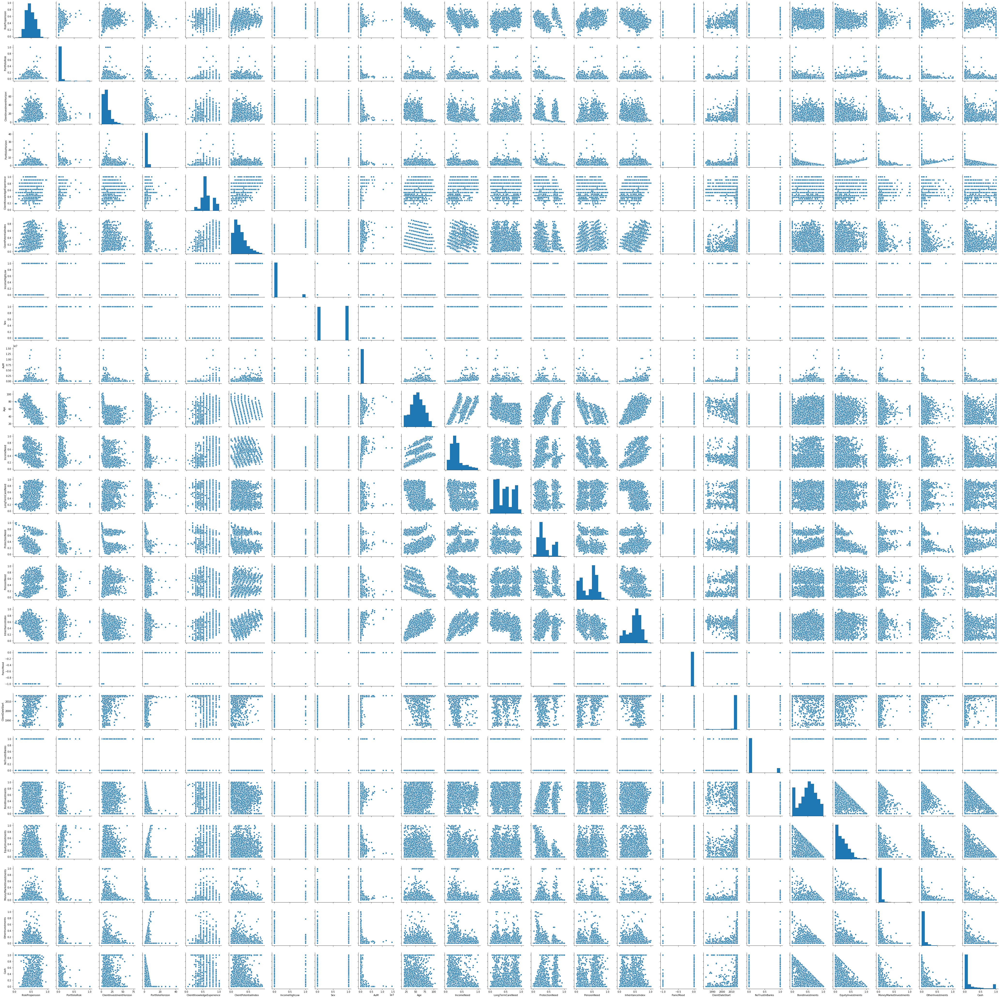

In [11]:
sns.pairplot(df1)
plt.show()

### Clustering demografico
Age - Ripartizione - Sex

In [12]:
x = df_person_var.loc[:, ["Sex", "Age", "Ripartizione"]]
x['Ripartizione'] = x['Ripartizione'].map({'NO' : 1, 'NE' : 2, 'C' : 3, 'S' : 4, 'ISOLE' : 5, 'Estero' : 6})
x

,Sex,Age,Ripartizione
0,1,22,5
1,1,61,3
2,0,24,1
3,0,46,2
4,0,57,1
...,...,...,...
4995,0,52,1
4996,1,45,3
4997,1,43,3
4998,0,65,4


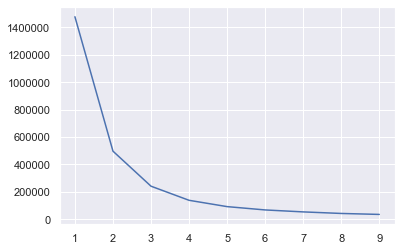

In [13]:
#3 clustes

elbow(range(1, 10), x)

In [14]:
kmeans = KMeans(3, n_init = 100)
identified_cluster_demo = kmeans.fit_predict(x)

df_cluster_demo = df1
df_cluster_demo['Ripartizione'] = df_cluster_demo['Ripartizione'].map({'NO' : 1, 'NE' : 2, 'C' : 3, 'S' : 4, 'ISOLE' : 5, 'Estero' : 6})
df_cluster_demo['Clusters'] = identified_cluster_demo

df_cluster_demo

C:\Users\giuli\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\Users\giuli\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,ClientID,RiskPropension,PortfolioRisk,ClientInvestmentHorizon,PortfolioHorizon,ClientKnowledgeExperience,ClientPotentialIndex,IncomeHighLow,Sex,AuM,...,NoTrustInBanks,Prov,BondInvestments,EquityInvestments,MoneyMarketInvestments,OtherInvestments,Cash,Regione,Ripartizione,Clusters
0,Client1,0.597553,0.087787,20.778831,3.7027,0.285714,0.148466,0,1,13719,...,0,PA,0.5730,0.4270,0.0000,0.0000,0.0000,SIC,5,2
1,Client2,0.501486,0.062290,15.228477,2.7327,0.714286,0.152761,0,1,45973,...,0,RM,0.5341,0.4466,0.0124,0.0000,0.0070,LAZ,3,0
2,Client3,0.554108,0.000000,9.675789,0.5000,0.523810,0.243558,0,0,10233,...,0,BS,0.0000,0.0000,0.0000,0.0000,1.0000,LOM,1,2
3,Client4,0.440729,0.032341,9.563829,2.5676,0.619048,0.089571,0,0,25144,...,0,RE,0.6428,0.1220,0.0407,0.1943,0.0002,EMR,2,0
4,Client5,0.540528,0.037852,17.941533,2.4911,0.428571,0.162577,0,0,222892,...,0,MI,0.1707,0.2701,0.5332,0.0045,0.0215,LOM,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,Client4996,0.417480,0.061442,39.616461,3.4684,0.619048,0.174847,0,0,26348,...,0,CO,0.3792,0.4520,0.0671,0.0830,0.0187,LOM,1,0
4996,Client4997,0.594193,0.023741,12.897960,1.0325,0.809524,0.292025,0,1,1002570,...,1,FI,0.9012,0.0283,0.0197,0.0495,0.0012,TOS,3,0
4997,Client4998,0.577775,0.000000,15.481864,0.5000,0.523810,0.096933,0,1,31032,...,0,PU,0.0000,0.0000,0.0000,0.0000,1.0000,MAR,3,0
4998,Client4999,0.402162,0.014505,7.220000,1.7193,0.523810,0.142945,0,0,50243,...,0,SA,0.6541,0.1626,0.1635,0.0000,0.0198,CAM,4,1


In [15]:
fig = px.scatter_3d(df_cluster_demo, x = 'Age', y = 'Sex', z = 'Ripartizione',
              color = 'Clusters')
fig.show()

In [16]:
mean_demo = df_cluster_demo.groupby('Clusters').mean()

mean_demo[['Age', 'Sex', 'Ripartizione', 'PortfolioRisk', 'RiskPropension', 'Cash', 'BondInvestments', 'EquityInvestments',
           'MoneyMarketInvestments', 'IncomeNeed', 'ProtectionNeed', 'ClientInvestmentHorizon', 'AuM']]

,Age,Sex,Ripartizione,PortfolioRisk,RiskPropension,Cash,BondInvestments,EquityInvestments,MoneyMarketInvestments,IncomeNeed,ProtectionNeed,ClientInvestmentHorizon,AuM
Clusters,,,,,,,,,,,,,
0,52.862477,0.528233,1.931694,0.049051,0.492027,0.147647,0.506449,0.242621,0.052367,0.331780,0.336785,14.774724,181064.887523
1,74.569994,0.443817,1.922787,0.048590,0.370980,0.122310,0.553926,0.221781,0.049257,0.477128,0.337453,6.807185,297888.983051
2,32.032451,0.549103,2.020495,0.044695,0.633925,0.289901,0.409776,0.222350,0.036686,0.172711,0.494656,16.007731,63414.381725


I gruppi di età sono sempre:
- Giovani: 32 anni
- Adulti: 52 anni
- Maturi: 74 anni

Con l'avanzare dell'età si nota uno spostamento sempre più verso la parità dei sessi (i maturi sono più femminili 0.44; i giovani sono più vicini a 0.5 con un ub che arriva a 0.57)

Sono tutti del nord (1 nord ovest, 2 nord est); i giovani sono i più contaminati dalle altre regioni di Italia.

Rischi finanziari e portafogli: 
- a tutte le età sono dei fifoni secondo portfolio risk, rischiano molto poco. Però hanno capacità di sopportare i rischi finanziari abbastanza alta... soprattutto i più giovani e meno i vecchi... Forse più è basso meno problemi hai se perdi?
- Gli indici di rischio del portafoglio sono molto bassi per ogni cluster, ma tutti, in modo abbastanza omogeneo, hanno poco investito in cash e tanto investito in azioni: i maturi hanno più del 50% in azioni anche se, guardando risk propension, sono quelli che sopportano peggio gli andamenti negativi del mercato;
- Dato che i maturi sono quelli che investono maggiormente in azioni hanno anche un ritorno sugli investimenti decisamente magigore, cosa che i giovincelli non hanno: considerato che la differenza tra quello che investono i giovani in azioni e quello che investono i maturi è di 15 pp i maturi riescono a far fruttare molto di più in quando la differenza tra gli income need è di 20 pp;
- I giovani distanziano di molto i cluster più adulti quando si parla di investimenti sicuri (sicuramente è per questo che i loro investimenti fruttano meno), ma sono anche quelli che puntano più sul lungo periodo (giustamente);
- Imbarazzante il divario tra quanto hanno investito i maturi vs adulti vs giovani.

In [17]:
#LB
LB_demo = mean_demo - (1.96 * df_cluster_demo.groupby('Clusters').std() / np.sqrt(df_cluster_demo.groupby('Clusters').count()))

LB_demo[['Age', 'Sex', 'Ripartizione', 'PortfolioRisk', 'RiskPropension', 'Cash', 'BondInvestments', 'EquityInvestments',
           'MoneyMarketInvestments', 'IncomeNeed', 'ProtectionNeed', 'ClientInvestmentHorizon', 'AuM']]

,Age,Sex,Ripartizione,PortfolioRisk,RiskPropension,Cash,BondInvestments,EquityInvestments,MoneyMarketInvestments,IncomeNeed,ProtectionNeed,ClientInvestmentHorizon,AuM
Clusters,,,,,,,,,,,,,
0,52.616558,0.507349,1.886846,0.047477,0.488377,0.136272,0.495540,0.234389,0.047913,0.325581,0.327974,14.446698,165249.322596
1,74.186080,0.419411,1.868584,0.045773,0.367187,0.109431,0.541152,0.212586,0.044882,0.468144,0.332103,6.582264,258880.923516
2,31.622111,0.520591,1.952405,0.041874,0.628893,0.268776,0.393073,0.210221,0.032422,0.167376,0.479653,15.517113,57374.700598


In [18]:
#UB
UB_demo = mean_demo + (1.96 * df_cluster_demo.groupby('Clusters').std() / np.sqrt(df_cluster_demo.groupby('Clusters').count()))

UB_demo[['Age', 'Sex', 'Ripartizione', 'PortfolioRisk', 'RiskPropension', 'Cash', 'BondInvestments', 'EquityInvestments',
           'MoneyMarketInvestments', 'IncomeNeed', 'ProtectionNeed', 'ClientInvestmentHorizon', 'AuM']]

,Age,Sex,Ripartizione,PortfolioRisk,RiskPropension,Cash,BondInvestments,EquityInvestments,MoneyMarketInvestments,IncomeNeed,ProtectionNeed,ClientInvestmentHorizon,AuM
Clusters,,,,,,,,,,,,,
0,53.108397,0.549117,1.976542,0.050625,0.495677,0.159022,0.517357,0.250854,0.056821,0.337980,0.345597,15.102751,196880.452450
1,74.953908,0.468223,1.976990,0.051408,0.374772,0.135189,0.566701,0.230975,0.053632,0.486113,0.342804,7.032107,336897.042585
2,32.442791,0.577615,2.088586,0.047515,0.638957,0.311026,0.426478,0.234479,0.040950,0.178047,0.509659,16.498350,69454.062852


In [19]:
kmeans_demo = KMeans(3, n_init = 100).fit(x)
labels_demo = kmeans_demo.labels_
metrics.silhouette_score(x, labels_demo, metric = 'euclidean')

0.5365338349950695

### Clustering culturale
age - client knowledge experience - income need

In [20]:
x = df_person_var.loc[:, ["IncomeNeed", "Age", "ClientKnowledgeExperience"]]
x

,IncomeNeed,Age,ClientKnowledgeExperience
0,0.079215,22,0.285714
1,0.281602,61,0.714286
2,0.124015,24,0.523810
3,0.209610,46,0.619048
4,0.320086,57,0.428571
...,...,...,...
4995,0.285918,52,0.619048
4996,0.774590,45,0.809524
4997,0.221488,43,0.523810
4998,0.320920,65,0.523810


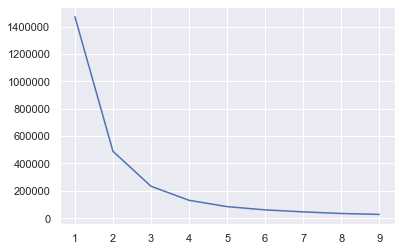

In [21]:
#Sono sempre 3 cluster

elbow(range(1, 10), x)

In [22]:
kmeans = KMeans(3, n_init = 100)
identified_cluster_cul = kmeans.fit_predict(x)

df_cluster_cul = df1
df_cluster_cul['Clusters'] = identified_cluster_cul

df_cluster_cul

C:\Users\giuli\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ClientID,RiskPropension,PortfolioRisk,ClientInvestmentHorizon,PortfolioHorizon,ClientKnowledgeExperience,ClientPotentialIndex,IncomeHighLow,Sex,AuM,...,NoTrustInBanks,Prov,BondInvestments,EquityInvestments,MoneyMarketInvestments,OtherInvestments,Cash,Regione,Ripartizione,Clusters
0,Client1,0.597553,0.087787,20.778831,3.7027,0.285714,0.148466,0,1,13719,...,0,PA,0.5730,0.4270,0.0000,0.0000,0.0000,SIC,5,1
1,Client2,0.501486,0.062290,15.228477,2.7327,0.714286,0.152761,0,1,45973,...,0,RM,0.5341,0.4466,0.0124,0.0000,0.0070,LAZ,3,2
2,Client3,0.554108,0.000000,9.675789,0.5000,0.523810,0.243558,0,0,10233,...,0,BS,0.0000,0.0000,0.0000,0.0000,1.0000,LOM,1,1
3,Client4,0.440729,0.032341,9.563829,2.5676,0.619048,0.089571,0,0,25144,...,0,RE,0.6428,0.1220,0.0407,0.1943,0.0002,EMR,2,2
4,Client5,0.540528,0.037852,17.941533,2.4911,0.428571,0.162577,0,0,222892,...,0,MI,0.1707,0.2701,0.5332,0.0045,0.0215,LOM,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,Client4996,0.417480,0.061442,39.616461,3.4684,0.619048,0.174847,0,0,26348,...,0,CO,0.3792,0.4520,0.0671,0.0830,0.0187,LOM,1,2
4996,Client4997,0.594193,0.023741,12.897960,1.0325,0.809524,0.292025,0,1,1002570,...,1,FI,0.9012,0.0283,0.0197,0.0495,0.0012,TOS,3,2
4997,Client4998,0.577775,0.000000,15.481864,0.5000,0.523810,0.096933,0,1,31032,...,0,PU,0.0000,0.0000,0.0000,0.0000,1.0000,MAR,3,2
4998,Client4999,0.402162,0.014505,7.220000,1.7193,0.523810,0.142945,0,0,50243,...,0,SA,0.6541,0.1626,0.1635,0.0000,0.0198,CAM,4,0


In [23]:
fig = px.scatter_3d(df_cluster_cul, x = 'IncomeNeed', y = 'Age', z = 'ClientKnowledgeExperience',
              color = 'Clusters')
fig.show()

In [24]:
mean_cul = df_cluster_cul.groupby('Clusters').mean()

mean_cul[['Age', 'PortfolioRisk', 'RiskPropension', 'Cash', 'BondInvestments', 'EquityInvestments',
           'MoneyMarketInvestments', 'IncomeNeed', 'ProtectionNeed', 'ClientInvestmentHorizon', 'ClientKnowledgeExperience']]

,Age,PortfolioRisk,RiskPropension,Cash,BondInvestments,EquityInvestments,MoneyMarketInvestments,IncomeNeed,ProtectionNeed,ClientInvestmentHorizon,ClientKnowledgeExperience
Clusters,,,,,,,,,,,
0,74.569994,0.048590,0.370980,0.122310,0.553926,0.221781,0.049257,0.477128,0.337453,6.807185,0.654829
1,32.032451,0.044695,0.633925,0.289901,0.409776,0.222350,0.036686,0.172711,0.494656,16.007731,0.541865
2,52.862477,0.049051,0.492027,0.147647,0.506449,0.242621,0.052367,0.331780,0.336785,14.774724,0.637544


L'obiettivo di questo clustering voleva essere quello di mostrare che se ne sai di più (alta knowledge experience) hai anche un maggior ritorno negli investimenti (income need).

Si osserva che i cluster di età sono sempre gli stessi. 

Si vede che all'aumentare dell'età in effetti aumenta l'esperienza e anche income need. Quindi direi che l'ipotesi iniziale è confermata.

In [25]:
#LB
LB_cul = mean_cul - (1.96 * df_cluster_cul.groupby('Clusters').std() / np.sqrt(df_cluster_cul.groupby('Clusters').count()))

LB_cul[['Age', 'PortfolioRisk', 'RiskPropension', 'Cash', 'BondInvestments', 'EquityInvestments',
           'MoneyMarketInvestments', 'IncomeNeed', 'ProtectionNeed', 'ClientInvestmentHorizon', 'ClientKnowledgeExperience']]

,Age,PortfolioRisk,RiskPropension,Cash,BondInvestments,EquityInvestments,MoneyMarketInvestments,IncomeNeed,ProtectionNeed,ClientInvestmentHorizon,ClientKnowledgeExperience
Clusters,,,,,,,,,,,
0,74.186080,0.045773,0.367187,0.109431,0.541152,0.212586,0.044882,0.468144,0.332103,6.582264,0.647434
1,31.622111,0.041874,0.628893,0.268776,0.393073,0.210221,0.032422,0.167376,0.479653,15.517113,0.532491
2,52.616558,0.047477,0.488377,0.136272,0.495540,0.234389,0.047913,0.325581,0.327974,14.446698,0.630808


In [26]:
#UB
UB_cul = mean_cul + (1.96 * df_cluster_cul.groupby('Clusters').std() / np.sqrt(df_cluster_cul.groupby('Clusters').count()))

UB_cul[['Age', 'PortfolioRisk', 'RiskPropension', 'Cash', 'BondInvestments', 'EquityInvestments',
           'MoneyMarketInvestments', 'IncomeNeed', 'ProtectionNeed', 'ClientInvestmentHorizon', 'ClientKnowledgeExperience']]

,Age,PortfolioRisk,RiskPropension,Cash,BondInvestments,EquityInvestments,MoneyMarketInvestments,IncomeNeed,ProtectionNeed,ClientInvestmentHorizon,ClientKnowledgeExperience
Clusters,,,,,,,,,,,
0,74.953908,0.051408,0.374772,0.135189,0.566701,0.230975,0.053632,0.486113,0.342804,7.032107,0.662224
1,32.442791,0.047515,0.638957,0.311026,0.426478,0.234479,0.040950,0.178047,0.509659,16.498350,0.551239
2,53.108397,0.050625,0.495677,0.159022,0.517357,0.250854,0.056821,0.337980,0.345597,15.102751,0.644281


In [27]:
kmeans_cul = KMeans(n_clusters = 3, n_init = 100).fit(x)
labels_cul = kmeans_cul.labels_
metrics.silhouette_score(x, labels_cul, metric = 'euclidean')

0.550982136093792

C:\Users\giuli\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




array([<matplotlib.axes._subplots.AxesSubplot object at 0x0000025324BA5F88>,
      dtype=object)

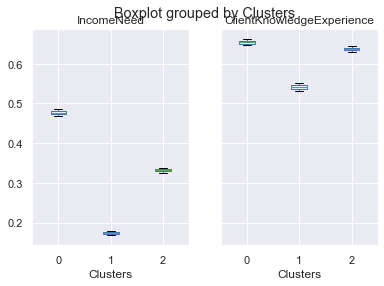

In [28]:
box = pd.concat([mean_cul, LB_cul, UB_cul])
box.boxplot(column = ['IncomeNeed', 'ClientKnowledgeExperience'], by = 'Clusters')

### Clustering a lungo termine
age - income need - protection need

In [29]:
x = df_person_var.loc[:, ["IncomeNeed", "Age", "ProtectionNeed"]]
x

,IncomeNeed,Age,ProtectionNeed
0,0.079215,22,0.204401
1,0.281602,61,0.153599
2,0.124015,24,0.769608
3,0.209610,46,0.226218
4,0.320086,57,0.703936
...,...,...,...
4995,0.285918,52,0.211391
4996,0.774590,45,0.707348
4997,0.221488,43,0.729378
4998,0.320920,65,0.337642


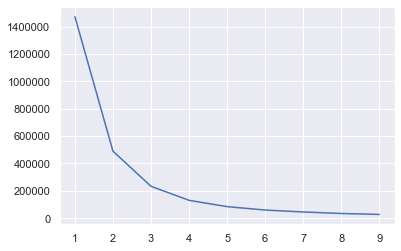

In [30]:
#ancora 3 cluster

elbow(range(1, 10), x)

In [31]:
kmeans = KMeans(3, n_init = 100)
identified_cluster_lt = kmeans.fit_predict(x)

df_cluster_lt = df1
df_cluster_lt['Clusters'] = identified_cluster_lt

df_cluster_lt

C:\Users\giuli\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ClientID,RiskPropension,PortfolioRisk,ClientInvestmentHorizon,PortfolioHorizon,ClientKnowledgeExperience,ClientPotentialIndex,IncomeHighLow,Sex,AuM,...,NoTrustInBanks,Prov,BondInvestments,EquityInvestments,MoneyMarketInvestments,OtherInvestments,Cash,Regione,Ripartizione,Clusters
0,Client1,0.597553,0.087787,20.778831,3.7027,0.285714,0.148466,0,1,13719,...,0,PA,0.5730,0.4270,0.0000,0.0000,0.0000,SIC,5,2
1,Client2,0.501486,0.062290,15.228477,2.7327,0.714286,0.152761,0,1,45973,...,0,RM,0.5341,0.4466,0.0124,0.0000,0.0070,LAZ,3,0
2,Client3,0.554108,0.000000,9.675789,0.5000,0.523810,0.243558,0,0,10233,...,0,BS,0.0000,0.0000,0.0000,0.0000,1.0000,LOM,1,2
3,Client4,0.440729,0.032341,9.563829,2.5676,0.619048,0.089571,0,0,25144,...,0,RE,0.6428,0.1220,0.0407,0.1943,0.0002,EMR,2,0
4,Client5,0.540528,0.037852,17.941533,2.4911,0.428571,0.162577,0,0,222892,...,0,MI,0.1707,0.2701,0.5332,0.0045,0.0215,LOM,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,Client4996,0.417480,0.061442,39.616461,3.4684,0.619048,0.174847,0,0,26348,...,0,CO,0.3792,0.4520,0.0671,0.0830,0.0187,LOM,1,0
4996,Client4997,0.594193,0.023741,12.897960,1.0325,0.809524,0.292025,0,1,1002570,...,1,FI,0.9012,0.0283,0.0197,0.0495,0.0012,TOS,3,0
4997,Client4998,0.577775,0.000000,15.481864,0.5000,0.523810,0.096933,0,1,31032,...,0,PU,0.0000,0.0000,0.0000,0.0000,1.0000,MAR,3,0
4998,Client4999,0.402162,0.014505,7.220000,1.7193,0.523810,0.142945,0,0,50243,...,0,SA,0.6541,0.1626,0.1635,0.0000,0.0198,CAM,4,1


In [32]:
fig = px.scatter_3d(df_cluster_lt, x = 'IncomeNeed', y = 'Age', z = 'ProtectionNeed',
              color = 'Clusters')
fig.show()

In [33]:
mean_lt = df_cluster_lt.groupby('Clusters').mean()

mean_lt[['Age', 'Sex', 'Ripartizione', 'PortfolioRisk', 'RiskPropension', 'Cash', 'BondInvestments', 'EquityInvestments',
           'MoneyMarketInvestments', 'IncomeNeed', 'ProtectionNeed', 'ClientInvestmentHorizon']]

,Age,Sex,Ripartizione,PortfolioRisk,RiskPropension,Cash,BondInvestments,EquityInvestments,MoneyMarketInvestments,IncomeNeed,ProtectionNeed,ClientInvestmentHorizon
Clusters,,,,,,,,,,,,
0,52.862477,0.528233,1.931694,0.049051,0.492027,0.147647,0.506449,0.242621,0.052367,0.331780,0.336785,14.774724
1,74.569994,0.443817,1.922787,0.048590,0.370980,0.122310,0.553926,0.221781,0.049257,0.477128,0.337453,6.807185
2,32.032451,0.549103,2.020495,0.044695,0.633925,0.289901,0.409776,0.222350,0.036686,0.172711,0.494656,16.007731


I cluster per età sono gli stessi che del cluster demografico.

I clienti del cluster più giovane hanno income need più basso e anche meno variabile, questo mi fa pensare che i giovani investano meno e di conseguenza abbiano meno ritorni dagli investimenti fatti (siano cedole da obbligazioni o dividendi da azioni). Crescendo di età income need aumenta praticamente di 15 pp ogni volta, ma è anche più variabile, questo per me significa che c'è una tendenza non uniforme ad investire di più.

Per quanto riguarda protection need si osserva che è più alto e più variabile nel gruppo dei più giovani, mentre si assesta ad un valore medio simile tra fascia di età media e matura, diventando via via più omogeneo. Questo forse perchè i giovani cercano investimenti sicuri, che proteggano i loro risparmi dalle fluttuazioni del mercato, mentre gli adulti che godono di un materasso più comodo su cui atterrare preferiscono rischiare di più in vista di maggiori guadagni.

##### Sono gli stessi valori del clustering demografico

In [34]:
#LB
LB_lt = mean_lt - (1.96 * df_cluster_lt.groupby('Clusters').std() / np.sqrt(df_cluster_lt.groupby('Clusters').count()))

LB_lt[['Age', 'Sex', 'Ripartizione', 'PortfolioRisk', 'RiskPropension', 'Cash', 'BondInvestments', 'EquityInvestments',
           'MoneyMarketInvestments', 'IncomeNeed', 'ProtectionNeed', 'ClientInvestmentHorizon']]

,Age,Sex,Ripartizione,PortfolioRisk,RiskPropension,Cash,BondInvestments,EquityInvestments,MoneyMarketInvestments,IncomeNeed,ProtectionNeed,ClientInvestmentHorizon
Clusters,,,,,,,,,,,,
0,52.616558,0.507349,1.886846,0.047477,0.488377,0.136272,0.495540,0.234389,0.047913,0.325581,0.327974,14.446698
1,74.186080,0.419411,1.868584,0.045773,0.367187,0.109431,0.541152,0.212586,0.044882,0.468144,0.332103,6.582264
2,31.622111,0.520591,1.952405,0.041874,0.628893,0.268776,0.393073,0.210221,0.032422,0.167376,0.479653,15.517113


In [35]:
#UB
UB_lt = mean_lt + (1.96 * df_cluster_lt.groupby('Clusters').std() / np.sqrt(df_cluster_lt.groupby('Clusters').count()))

UB_lt[['Age', 'Sex', 'Ripartizione', 'PortfolioRisk', 'RiskPropension', 'Cash', 'BondInvestments', 'EquityInvestments',
           'MoneyMarketInvestments', 'IncomeNeed', 'ProtectionNeed', 'ClientInvestmentHorizon']]

,Age,Sex,Ripartizione,PortfolioRisk,RiskPropension,Cash,BondInvestments,EquityInvestments,MoneyMarketInvestments,IncomeNeed,ProtectionNeed,ClientInvestmentHorizon
Clusters,,,,,,,,,,,,
0,53.108397,0.549117,1.976542,0.050625,0.495677,0.159022,0.517357,0.250854,0.056821,0.337980,0.345597,15.102751
1,74.953908,0.468223,1.976990,0.051408,0.374772,0.135189,0.566701,0.230975,0.053632,0.486113,0.342804,7.032107
2,32.442791,0.577615,2.088586,0.047515,0.638957,0.311026,0.426478,0.234479,0.040950,0.178047,0.509659,16.498350


In [36]:
kmeans_lt = KMeans(n_clusters = 3).fit(x)
labels_lt = kmeans_lt.labels_
metrics.silhouette_score(x, labels_lt, metric = 'euclidean')

0.5539382831828387

### Cluster dei pro di Davide
Risk propension - Panic Mood - Inheritance index

In [37]:
x = df_person_var.loc[:, ["RiskPropension", "PanicMood", "InheritanceIndex"]]
x

,RiskPropension,PanicMood,InheritanceIndex
0,0.597553,0,0.114803
1,0.501486,0,0.505362
2,0.554108,0,0.069924
3,0.440729,0,0.415670
4,0.540528,0,0.335057
...,...,...,...
4995,0.417480,0,0.541309
4996,0.594193,0,0.577970
4997,0.577775,0,0.421414
4998,0.402162,0,0.530526


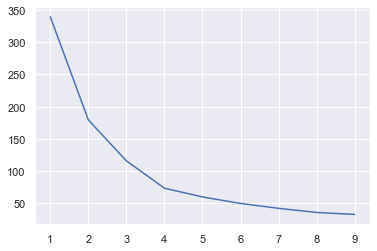

In [38]:
elbow(range(1, 10), x)

In [49]:
kmeans = KMeans(4, n_init = 100)
identified_cluster_pro = kmeans.fit_predict(x)

df_cluster_pro = df1
df_cluster_pro['Clusters'] = identified_cluster_pro

df_cluster_pro

C:\Users\giuli\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ClientID,RiskPropension,PortfolioRisk,ClientInvestmentHorizon,PortfolioHorizon,ClientKnowledgeExperience,ClientPotentialIndex,IncomeHighLow,Sex,AuM,...,NoTrustInBanks,Prov,BondInvestments,EquityInvestments,MoneyMarketInvestments,OtherInvestments,Cash,Regione,Ripartizione,Clusters
0,Client1,0.597553,0.087787,20.778831,3.7027,0.285714,0.148466,0,1,13719,...,0,PA,0.5730,0.4270,0.0000,0.0000,0.0000,SIC,5,1
1,Client2,0.501486,0.062290,15.228477,2.7327,0.714286,0.152761,0,1,45973,...,0,RM,0.5341,0.4466,0.0124,0.0000,0.0070,LAZ,3,0
2,Client3,0.554108,0.000000,9.675789,0.5000,0.523810,0.243558,0,0,10233,...,0,BS,0.0000,0.0000,0.0000,0.0000,1.0000,LOM,1,1
3,Client4,0.440729,0.032341,9.563829,2.5676,0.619048,0.089571,0,0,25144,...,0,RE,0.6428,0.1220,0.0407,0.1943,0.0002,EMR,2,0
4,Client5,0.540528,0.037852,17.941533,2.4911,0.428571,0.162577,0,0,222892,...,0,MI,0.1707,0.2701,0.5332,0.0045,0.0215,LOM,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,Client4996,0.417480,0.061442,39.616461,3.4684,0.619048,0.174847,0,0,26348,...,0,CO,0.3792,0.4520,0.0671,0.0830,0.0187,LOM,1,3
4996,Client4997,0.594193,0.023741,12.897960,1.0325,0.809524,0.292025,0,1,1002570,...,1,FI,0.9012,0.0283,0.0197,0.0495,0.0012,TOS,3,0
4997,Client4998,0.577775,0.000000,15.481864,0.5000,0.523810,0.096933,0,1,31032,...,0,PU,0.0000,0.0000,0.0000,0.0000,1.0000,MAR,3,0
4998,Client4999,0.402162,0.014505,7.220000,1.7193,0.523810,0.142945,0,0,50243,...,0,SA,0.6541,0.1626,0.1635,0.0000,0.0198,CAM,4,3


In [50]:
fig = px.scatter_3d(df_cluster_pro, x = 'RiskPropension', y = 'PanicMood', z = 'InheritanceIndex',
              color = 'Clusters')
fig.show()

In [52]:
mean_pro = df_cluster_pro.groupby('Clusters').mean()

mean_pro[['Age', 'Sex', 'Ripartizione', 'PanicMood', 'PortfolioRisk', 'RiskPropension', 'Cash', 'BondInvestments', 'EquityInvestments',
           'MoneyMarketInvestments', 'IncomeNeed', 'ProtectionNeed', 'InheritanceIndex', 'ClientInvestmentHorizon']]

,Age,Sex,Ripartizione,PanicMood,PortfolioRisk,RiskPropension,Cash,BondInvestments,EquityInvestments,MoneyMarketInvestments,IncomeNeed,ProtectionNeed,InheritanceIndex,ClientInvestmentHorizon
Clusters,,,,,,,,,,,,,,
0,50.736786,0.491543,1.937632,0.0,0.045802,0.521786,0.163560,0.505875,0.229264,0.048926,0.297495,0.372468,0.469046,14.050277
1,32.828933,0.552270,2.049630,0.0,0.044614,0.632523,0.300309,0.409521,0.217535,0.039386,0.172460,0.497851,0.161167,16.442108
2,57.015152,0.484848,2.287879,-1.0,0.022738,0.463586,0.309274,0.486236,0.095591,0.073761,0.308108,0.792851,0.488719,2.836931
3,68.875912,0.498783,1.904136,0.0,0.052092,0.387822,0.118874,0.534010,0.243495,0.049484,0.459555,0.305539,0.655048,9.583045


Ciò che clusterizza davvero alla fine è solo panic mood 

Ci sono sempre i giovani (32y), gli adulti si splittano in 50y e 57y e i maturi ringiovaniscono molto (68y)

Quelli con panic mood = -1 sono quelli che si avvicinano ai 60y (pensione?) e in effetti il loro portfolio risk è notevolmente più basso rispetto a quello degli altri, ma comunque hanno una disponibilità a sopportare i rischi finanziari (risk propension) più alta rispetto a quella dei nuovi maturi che hanno un portfolio risk che è quasi doppio rispetto al loro.

http://www.consob.it/web/investor-education/errori-comportamentali-crisi

Hanno davvero comportamenti dettati dall'emotività e non dalla ratio (vedi link)

I giovani hanno alta risk propension, ma sono tra quelli che mettono più in cash e meno in azioni

Forse l'interpretazione della risk propension è inversa

Quelli che vanno nel panico hanno un orizzonte di investimento brevissimo, ma un income need che è più basso solo di quello dei nuovi maturi, comunque sono quelli che investono di più (ovviamente) in strumenti finaziari protetti dal rischio.

Inheritance index dipende fortemente dall'età: più invecchi più senti il bisogno di sistemare le tue finanze per i posteri.

In [56]:
#LB
LB_pro = mean_pro - (1.96 * df_cluster_pro.groupby('Clusters').std() / np.sqrt(df_cluster_pro.groupby('Clusters').count()))

LB_pro[['Age', 'Sex', 'Ripartizione', 'PanicMood', 'PortfolioRisk', 'RiskPropension', 'Cash', 'BondInvestments', 'EquityInvestments',
           'MoneyMarketInvestments', 'IncomeNeed', 'ProtectionNeed', 'InheritanceIndex', 'ClientInvestmentHorizon']]

,Age,Sex,Ripartizione,PanicMood,PortfolioRisk,RiskPropension,Cash,BondInvestments,EquityInvestments,MoneyMarketInvestments,IncomeNeed,ProtectionNeed,InheritanceIndex,ClientInvestmentHorizon
Clusters,,,,,,,,,,,,,,
0,50.272906,0.469010,1.888956,0.0,0.044051,0.517596,0.150594,0.493692,0.220378,0.044198,0.291251,0.362365,0.465496,13.705361
1,32.183411,0.520582,1.973189,0.0,0.041523,0.626548,0.276829,0.390650,0.204057,0.034198,0.166343,0.481439,0.156452,15.891138
2,53.139608,0.363350,1.995398,-1.0,0.018453,0.424152,0.213618,0.406739,0.060830,0.025211,0.275352,0.773084,0.451645,2.559842
3,68.388633,0.477160,1.857030,0.0,0.049755,0.384380,0.107815,0.523038,0.235241,0.045868,0.451638,0.300792,0.651340,9.270886


In [57]:
#UB
UB_pro = mean_pro + (1.96 * df_cluster_pro.groupby('Clusters').std() / np.sqrt(df_cluster_pro.groupby('Clusters').count()))

UB_pro[['Age', 'Sex', 'Ripartizione', 'PanicMood', 'PortfolioRisk', 'RiskPropension', 'Cash', 'BondInvestments', 'EquityInvestments',
           'MoneyMarketInvestments', 'IncomeNeed', 'ProtectionNeed', 'InheritanceIndex', 'ClientInvestmentHorizon']]

,Age,Sex,Ripartizione,PanicMood,PortfolioRisk,RiskPropension,Cash,BondInvestments,EquityInvestments,MoneyMarketInvestments,IncomeNeed,ProtectionNeed,InheritanceIndex,ClientInvestmentHorizon
Clusters,,,,,,,,,,,,,,
0,51.200667,0.514076,1.986308,0.0,0.047552,0.525976,0.176527,0.518058,0.238151,0.053653,0.303740,0.382572,0.472596,14.395193
1,33.474456,0.583958,2.126072,0.0,0.047705,0.638498,0.323788,0.428392,0.231013,0.044574,0.178577,0.514264,0.165881,16.993077
2,60.890695,0.606347,2.580360,-1.0,0.027022,0.503019,0.404931,0.565733,0.130352,0.122310,0.340864,0.812619,0.525793,3.114021
3,69.363192,0.520407,1.951242,0.0,0.054430,0.391263,0.129933,0.544981,0.251750,0.053099,0.467471,0.310286,0.658756,9.895204


Su questo devo ancora ragionarci... non mi convince

In [58]:
kmeans_pro = KMeans(n_clusters = 3).fit(x)
labels_pro = kmeans_pro.labels_
metrics.silhouette_score(x, labels_pro, metric = 'euclidean')

0.5193551073537717

### Clustering Culturale modificato con i pro di Devide
Risk propension - income need - client knowledge experience

In [59]:
x = df_person_var.loc[:, ["IncomeNeed", "RiskPropension", "ClientKnowledgeExperience"]]
x

,IncomeNeed,RiskPropension,ClientKnowledgeExperience
0,0.079215,0.597553,0.285714
1,0.281602,0.501486,0.714286
2,0.124015,0.554108,0.523810
3,0.209610,0.440729,0.619048
4,0.320086,0.540528,0.428571
...,...,...,...
4995,0.285918,0.417480,0.619048
4996,0.774590,0.594193,0.809524
4997,0.221488,0.577775,0.523810
4998,0.320920,0.402162,0.523810


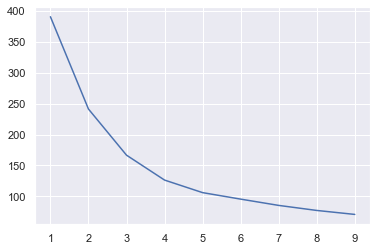

In [60]:
#Sono sempre 3 cluster

elbow(range(1, 10), x)

In [61]:
kmeans = KMeans(4, n_init = 100)
identified_cluster_culpro = kmeans.fit_predict(x)

df_cluster_culpro = df1
df_cluster_culpro['Clusters'] = identified_cluster_culpro

df_cluster_culpro

C:\Users\giuli\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ClientID,RiskPropension,PortfolioRisk,ClientInvestmentHorizon,PortfolioHorizon,ClientKnowledgeExperience,ClientPotentialIndex,IncomeHighLow,Sex,AuM,...,NoTrustInBanks,Prov,BondInvestments,EquityInvestments,MoneyMarketInvestments,OtherInvestments,Cash,Regione,Ripartizione,Clusters
0,Client1,0.597553,0.087787,20.778831,3.7027,0.285714,0.148466,0,1,13719,...,0,PA,0.5730,0.4270,0.0000,0.0000,0.0000,SIC,5,3
1,Client2,0.501486,0.062290,15.228477,2.7327,0.714286,0.152761,0,1,45973,...,0,RM,0.5341,0.4466,0.0124,0.0000,0.0070,LAZ,3,1
2,Client3,0.554108,0.000000,9.675789,0.5000,0.523810,0.243558,0,0,10233,...,0,BS,0.0000,0.0000,0.0000,0.0000,1.0000,LOM,1,3
3,Client4,0.440729,0.032341,9.563829,2.5676,0.619048,0.089571,0,0,25144,...,0,RE,0.6428,0.1220,0.0407,0.1943,0.0002,EMR,2,0
4,Client5,0.540528,0.037852,17.941533,2.4911,0.428571,0.162577,0,0,222892,...,0,MI,0.1707,0.2701,0.5332,0.0045,0.0215,LOM,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,Client4996,0.417480,0.061442,39.616461,3.4684,0.619048,0.174847,0,0,26348,...,0,CO,0.3792,0.4520,0.0671,0.0830,0.0187,LOM,1,0
4996,Client4997,0.594193,0.023741,12.897960,1.0325,0.809524,0.292025,0,1,1002570,...,1,FI,0.9012,0.0283,0.0197,0.0495,0.0012,TOS,3,2
4997,Client4998,0.577775,0.000000,15.481864,0.5000,0.523810,0.096933,0,1,31032,...,0,PU,0.0000,0.0000,0.0000,0.0000,1.0000,MAR,3,3
4998,Client4999,0.402162,0.014505,7.220000,1.7193,0.523810,0.142945,0,0,50243,...,0,SA,0.6541,0.1626,0.1635,0.0000,0.0198,CAM,4,0


In [62]:
fig = px.scatter_3d(df_cluster_culpro, x = 'IncomeNeed', y = 'RiskPropension', z = 'ClientKnowledgeExperience',
              color = 'Clusters')
fig.show()

In [63]:
mean_culpro = df_cluster_culpro.groupby('Clusters').mean()

mean_culpro[['Age', 'PortfolioRisk', 'RiskPropension', 'Cash', 'BondInvestments', 'EquityInvestments',
           'MoneyMarketInvestments', 'IncomeNeed', 'ProtectionNeed', 'ClientInvestmentHorizon', 'ClientKnowledgeExperience']]

,Age,PortfolioRisk,RiskPropension,Cash,BondInvestments,EquityInvestments,MoneyMarketInvestments,IncomeNeed,ProtectionNeed,ClientInvestmentHorizon,ClientKnowledgeExperience
Clusters,,,,,,,,,,,
0,64.168503,0.045092,0.399709,0.161103,0.516688,0.214495,0.054553,0.333909,0.316245,10.576620,0.529920
1,57.979468,0.054466,0.460064,0.131170,0.497549,0.266857,0.047320,0.318780,0.315147,12.643893,0.783596
2,65.314655,0.053805,0.450949,0.083412,0.570978,0.245763,0.047406,0.723550,0.325510,10.643132,0.767926
3,36.751067,0.041826,0.624604,0.269859,0.444870,0.208771,0.040560,0.179866,0.517387,15.419723,0.494412


Con questo clustering le età si spostano verso l'alto

Gli orizzonti temporali sono molto più alti di quelli che si vedevano prima
C'è un forte gap tra l'esperienza degi 65y e 57y vs quella degli altri
I più giovani restano quelli che cercano maggior protezione e i più anziani restano quelli che hanno più ritorni dagli investimenti (non chè quello che investono di più in azioni, ma anche i terzultimi dal punto di vista della propnesione al rischio)

In [65]:
#LB
LB_culpro = mean_culpro - (1.96 * df_cluster_culpro.groupby('Clusters').std() / np.sqrt(df_cluster_culpro.groupby('Clusters').count()))

LB_culpro[['Age', 'PortfolioRisk', 'RiskPropension', 'Cash', 'BondInvestments', 'EquityInvestments',
           'MoneyMarketInvestments', 'IncomeNeed', 'ProtectionNeed', 'ClientInvestmentHorizon', 'ClientKnowledgeExperience']]

,Age,PortfolioRisk,RiskPropension,Cash,BondInvestments,EquityInvestments,MoneyMarketInvestments,IncomeNeed,ProtectionNeed,ClientInvestmentHorizon,ClientKnowledgeExperience
Clusters,,,,,,,,,,,
0,63.544892,0.042234,0.395722,0.145801,0.502419,0.204934,0.048651,0.330233,0.309783,10.207220,0.525332
1,57.216848,0.051959,0.454025,0.117249,0.483707,0.255517,0.042555,0.314203,0.305243,12.201963,0.779553
2,64.319209,0.051498,0.443605,0.069669,0.555982,0.233450,0.043630,0.713944,0.313780,10.043328,0.759292
3,36.192929,0.039622,0.620481,0.251398,0.429468,0.198212,0.036046,0.176439,0.504065,14.992462,0.488296


In [66]:
#UB
UB_culpro = mean_culpro + (1.96 * df_cluster_culpro.groupby('Clusters').std() / np.sqrt(df_cluster_culpro.groupby('Clusters').count()))

UB_culpro[['Age', 'PortfolioRisk', 'RiskPropension', 'Cash', 'BondInvestments', 'EquityInvestments',
           'MoneyMarketInvestments', 'IncomeNeed', 'ProtectionNeed', 'ClientInvestmentHorizon', 'ClientKnowledgeExperience']]

,Age,PortfolioRisk,RiskPropension,Cash,BondInvestments,EquityInvestments,MoneyMarketInvestments,IncomeNeed,ProtectionNeed,ClientInvestmentHorizon,ClientKnowledgeExperience
Clusters,,,,,,,,,,,
0,64.792113,0.047951,0.403695,0.176405,0.530957,0.224055,0.060454,0.337586,0.322707,10.946020,0.534509
1,58.742088,0.056974,0.466103,0.145091,0.511391,0.278197,0.052085,0.323358,0.325052,13.085822,0.787639
2,66.310101,0.056113,0.458293,0.097155,0.585973,0.258076,0.051181,0.733155,0.337240,11.242935,0.776559
3,37.309205,0.044031,0.628727,0.288319,0.460271,0.219330,0.045075,0.183293,0.530708,15.846985,0.500528


In [64]:
kmeans_culpro = KMeans(n_clusters = 3, n_init = 100).fit(x)
labels_culpro = kmeans_cul.labels_
metrics.silhouette_score(x, labels_culpro, metric = 'euclidean')

#Questo fa un po' troppo schifo

0.10591462771541676

### Clustering bi dimensionale 
income need - ClientInvestmentHorizon

Obiettivo: aumentare la silhouette e vedere che non cambiano i valori

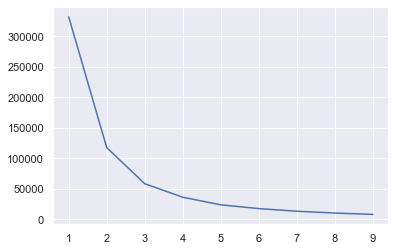

In [60]:
x = df1[["IncomeNeed", "ClientInvestmentHorizon"]]

#Sono sempre 3 cluster

elbow(range(1, 10), x)

C:\Users\giuli\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


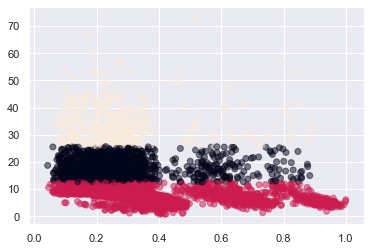

In [61]:
kmeans = KMeans(3, n_init = 100)
identified_cluster_bi = kmeans.fit_predict(x)

df_cluster_bi = df1
df_cluster_bi['Clusters'] = identified_cluster_bi

plt.scatter(df_cluster_bi['IncomeNeed'], df_cluster_bi['ClientInvestmentHorizon'], c = df_cluster_bi['Clusters'], alpha=0.5)

In [46]:
kmeans_bi = KMeans(n_clusters = 3, n_init = 100).fit(x)
labels_bi = kmeans_bi.labels_
metrics.silhouette_score(x, labels_bi, metric = 'euclidean')

0.6022738485898491

La silhouette è buona, ma non è interessante... in questo cluster è importante solo ClientInvestmentHorizon, IncomeNeed non fa differrenza... Anche aumentando il numero di cluster continua a farli in orizzontale

#### Agglomerativo

C:\Users\giuli\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


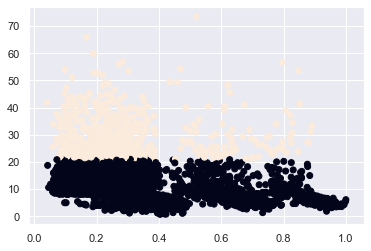

In [49]:
from sklearn.cluster import AgglomerativeClustering
agg = AgglomerativeClustering().fit(x)

identified_cluster_bi2 = agg.fit_predict(x)

df_cluster_bi2 = df1
df_cluster_bi2['Clusters'] = identified_cluster_bi2

plt.scatter(df_cluster_bi2['IncomeNeed'], df_cluster_bi2['ClientInvestmentHorizon'], c = df_cluster_bi2['Clusters'])

#Anche lui non se la cava benissimo...

In [50]:
labels_agg = agg.labels_
metrics.silhouette_score(x, labels_agg, metric = 'euclidean')

0.6817052394843485

#### DBSCAN

In [51]:
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps = 0.9, min_samples = 40, metric = 'euclidean').fit(x) 
labels_db = dbscan.labels_

metrics.silhouette_score(x, labels_db, metric = 'euclidean')

#Sil molto meglio ma esagerato numero di clusters... decisamente non interpretabile

0.7154242089583834

In [52]:
np.unique(labels_db)

array([-1,  0], dtype=int64)

C:\Users\giuli\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


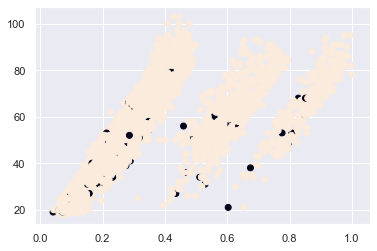

In [53]:
identified_cluster_bi3 = dbscan.fit_predict(x)

df_cluster_bi3 = df1
df_cluster_bi3['Clusters'] = identified_cluster_bi3

plt.scatter(df_cluster_bi3['IncomeNeed'], df_cluster_bi3['Age'], c = df_cluster_bi3['Clusters'])

### Clustering bidimensionale

Long term care need - risk propension

Se ho bisogno di cure in futuro riesco a rischiare di più?

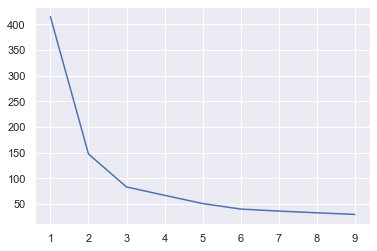

In [66]:
x = df1[["LongTermCareNeed", "RiskPropension"]]

#Sono sempre 3 cluster

elbow(range(1, 10), x)

C:\Users\giuli\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


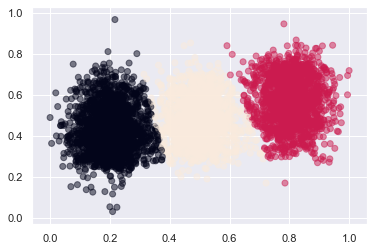

In [67]:
kmeans = KMeans(3, n_init = 100)
identified_cluster_bi = kmeans.fit_predict(x)

df_cluster_bi = df1
df_cluster_bi['Clusters'] = identified_cluster_bi

plt.scatter(df_cluster_bi['LongTermCareNeed'], df_cluster_bi['RiskPropension'], c = df_cluster_bi['Clusters'], alpha=0.5)

In [68]:
kmeans_bi = KMeans(n_clusters = 3, n_init = 100).fit(x)
labels_bi = kmeans_bi.labels_
metrics.silhouette_score(x, labels_bi, metric = 'euclidean')

0.5082223814467375

La sil di questo cluster è inferiore a quella di altri, ma almeno ha clusterizzato bene

In [71]:
mean_bi = df_cluster_bi.groupby('Clusters').mean()

mean_bi[['Age', 'LongTermCareNeed', 'RiskPropension', 'PortfolioRisk', 'Cash', 'BondInvestments', 'EquityInvestments',
           'MoneyMarketInvestments', 'IncomeNeed', 'ProtectionNeed', 'ClientInvestmentHorizon', 'ClientKnowledgeExperience']]

,Age,LongTermCareNeed,RiskPropension,PortfolioRisk,Cash,BondInvestments,EquityInvestments,MoneyMarketInvestments,IncomeNeed,ProtectionNeed,ClientInvestmentHorizon,ClientKnowledgeExperience
Clusters,,,,,,,,,,,,
0,64.813098,0.202315,0.427122,0.050245,0.138588,0.525441,0.232423,0.049914,0.408428,0.351408,10.250998,0.645652
1,41.579402,0.805627,0.573985,0.045822,0.240953,0.454564,0.222448,0.041279,0.253041,0.435503,15.143196,0.572694
2,55.207483,0.503352,0.477622,0.046775,0.150214,0.508363,0.238315,0.051169,0.339690,0.342455,12.854050,0.635504


Pian piano che si cresce con l'età l'indice del bisogno di cure da anziano diminuisce mentre la risk propension ha un andamento inverso: riesco ad attutire meglio i rischi del mercato quando sono più giovane. 

E comunque avendo una risk propension elevata sono quelli che mettono più in cash e meno in azioni e di conseguenza hanno dei ritorni sugli investimenti più bassi. Questo perchè per loro è di primaria importanza investire su prodotti sicuri (alta protection need) e i loro investimenti sono quelli più a lungo termine. 

Il consiglio è quello di smuovere i giovani e farli investire di più perchè possono permetterselo, ma hanno paura. Il tutto potrebbe essere accompagnato da formazione (dato che sono quelli con knowledge experience più bassa).

### Cluster bidimensionale 2

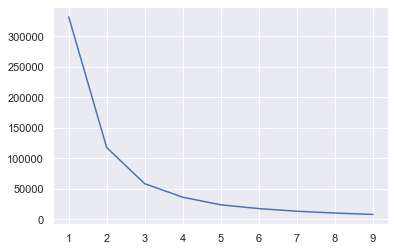

In [79]:
x = df1[["ClientPotentialIndex", "ClientInvestmentHorizon"]]

#Sono sempre 3 cluster

elbow(range(1, 10), x)

C:\Users\giuli\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


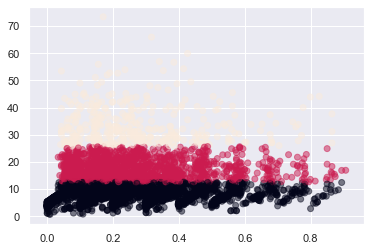

In [80]:
kmeans = KMeans(3, n_init = 100)
identified_cluster_bi = kmeans.fit_predict(x)

df_cluster_bi = df1
df_cluster_bi['Clusters'] = identified_cluster_bi

plt.scatter(df_cluster_bi['ClientPotentialIndex'], df_cluster_bi['ClientInvestmentHorizon'], c = df_cluster_bi['Clusters'], alpha=0.5)

In [81]:
kmeans_bi = KMeans(n_clusters = 3, n_init = 100).fit(x)
labels_bi = kmeans_bi.labels_
metrics.silhouette_score(x, labels_bi, metric = 'euclidean')

0.6021949229669167

In [82]:
mean_bi = df_cluster_bi.groupby('Clusters').mean()

mean_bi[['Age', 'ClientInvestmentHorizon', 'ClientPotentialIndex', 'IncomeNeed', 'RiskPropension', 'PortfolioRisk', 'Cash', 'BondInvestments', 'EquityInvestments',
           'MoneyMarketInvestments', 'ProtectionNeed', 'ClientKnowledgeExperience']]

,Age,ClientInvestmentHorizon,ClientPotentialIndex,IncomeNeed,RiskPropension,PortfolioRisk,Cash,BondInvestments,EquityInvestments,MoneyMarketInvestments,ProtectionNeed,ClientKnowledgeExperience
Clusters,,,,,,,,,,,,
0,60.163272,7.762596,0.248239,0.377287,0.458002,0.046556,0.157322,0.516263,0.228213,0.047904,0.369250,0.624867
1,45.819435,17.361344,0.269545,0.275294,0.537787,0.050018,0.199503,0.470651,0.233450,0.048962,0.388148,0.611696
2,45.964578,33.931354,0.273036,0.288867,0.529742,0.050683,0.203716,0.461582,0.247099,0.040502,0.362397,0.618010


Questo cluster ha una buona sil ma a clusterizzare è solo client investment horizon, il potential index è omogeneo... e pure tutti gli altri attributi hanno valore abbastanza omogeneo 

In [82]:
df1[df1['Age'] > 99]

#Eredi che attendono la fine degli investimenti?

,ClientID,RiskPropension,PortfolioRisk,ClientInvestmentHorizon,PortfolioHorizon,ClientKnowledgeExperience,ClientPotentialIndex,IncomeHighLow,Sex,AuM,...,NoTrustInBanks,Prov,BondInvestments,EquityInvestments,MoneyMarketInvestments,OtherInvestments,Cash,Regione,Ripartizione,Clusters
1048,Client1049,0.304415,0.000000,1.97,0.5000,0.523810,0.0,0,0,26955,...,0,TV,0.0000,0.0000,0.0,0.0,1.0000,VEN,2,1
1331,Client1332,0.380732,0.056567,3.35,1.5975,0.523810,0.1,0,0,187191,...,1,PR,0.7146,0.1875,0.0,0.0,0.0978,EMR,2,1
1841,Client1842,0.388574,0.013899,1.31,0.5000,0.714286,0.3,0,0,221380,...,1,TS,0.4546,0.0000,0.0,0.0,0.5454,FVG,2,1
2797,Client2798,0.388574,0.013899,1.31,0.5000,0.714286,0.3,0,0,221380,...,1,TS,0.4546,0.0000,0.0,0.0,0.5454,FVG,2,1
3220,Client3221,0.380732,0.056567,3.35,1.5975,0.523810,0.1,0,0,187191,...,1,PR,0.7146,0.1875,0.0,0.0,0.0978,EMR,2,1
